In [148]:
import re
import pandas as pd
import numpy as np
import os
from shutil import copyfile
import networkx as nx
import nxviz as nv
import matplotlib.pyplot as plt
import pprint

In [2]:
re_Date = re.compile(r'^Date\:\s\w{3}\,\s\d{1,2}\s(\w{3})\s(\d{4}).+\n')
#re_ID = re.compile(r'^Message\-ID\:\s\<(\d{8}\.\d{13})\.JavaMail\.evans\@thyme\>\n')
def sortfile(inputpath,outputpath, name, directory):
    try:
        file = open(inputpath, encoding = 'ansi')    #, encoding='cp1252'  'utf-8'
        #print(inputpath)
        count = 0
        for line in file.readlines():
            line = line.lstrip()
            if count == 1:
                Date = re_Date.findall(line)
                Month = Date[0][0]
                Year = Date[0][1]
                count = 0
                break
            elif count ==0:
                count = 1
                #ID = re_ID.findall(line)[0]
                #print(ID)
        if not os.path.exists(outputpath + '\\' + Year):
            os.makedirs(outputpath + '\\' + Year)
        if not os.path.exists(outputpath + '\\' + Year + '\\' + Month):
            os.makedirs(outputpath + '\\' + Year + '\\' + Month)
        copyfile(inputpath, outputpath + '\\' + Year + '\\' + Month + '\\' + directory + str(name))  # + '\\' + str(name)
    except:
        print(inputpath)
def recursiveopen(inputpath, outputpath, directory = ''):
    for name in os.listdir(inputpath):
        if os.path.isfile(inputpath + '\\' + str(name)):
            sortfile(inputpath + '\\' + str(name), outputpath, name, directory)
        else:
            recursiveopen(inputpath + '\\' + str(name), outputpath, directory + str(name) + '~')

In [3]:
outputpath = 'E:\\dataset\\enron_mail_20150507\\sortbytime'
inputpath = 'E:\\dataset\\enron_mail_20150507\\maildir'  # for text add \\allen-p

In [161]:
recursiveopen(inputpath,outputpath, '')

E:\dataset\enron_mail_20150507\maildir\beck-s\inbox\763
E:\dataset\enron_mail_20150507\maildir\dasovich-j\all_documents\29349
E:\dataset\enron_mail_20150507\maildir\dasovich-j\notes_inbox\11527
E:\dataset\enron_mail_20150507\maildir\gay-r\all_documents\59
E:\dataset\enron_mail_20150507\maildir\gay-r\all_documents\82
E:\dataset\enron_mail_20150507\maildir\gay-r\sent\59
E:\dataset\enron_mail_20150507\maildir\gay-r\sent\82
E:\dataset\enron_mail_20150507\maildir\griffith-j\deleted_items\1175
E:\dataset\enron_mail_20150507\maildir\griffith-j\inbox\66
E:\dataset\enron_mail_20150507\maildir\kaminski-v\sent_items\2524
E:\dataset\enron_mail_20150507\maildir\kean-s\california___working_group\163
E:\dataset\enron_mail_20150507\maildir\kitchen-l\_americas\regulatory\113
E:\dataset\enron_mail_20150507\maildir\quigley-d\myfriends\142
E:\dataset\enron_mail_20150507\maildir\quigley-d\myfriends\44
E:\dataset\enron_mail_20150507\maildir\ring-a\inbox\9
E:\dataset\enron_mail_20150507\maildir\sanders-r\bas

In [114]:
re_From = re.compile(r'^From\:\s(.*)')
re_To = re.compile(r'^To\:\s(.*)')
re_Subject = re.compile(r'^Subject\:\s?(.*)')
re_Cc = re.compile(r'^Cc\:\s(.*)')
re_MimeVersion = re.compile(r'^Mime-Version\:\s(.*)')
re_tab = re.compile(r'^\t(.*)')
re_email = re.compile(r'[0-9a-zA-Z\.\_\-]*\@[0-9a-zA-Z\.\-]+\.[a-zA-Z]{2,4}')

In [161]:
df = pd.DataFrame(columns=['From', 'To'])
df.info()
def build_df(df_month,path):
    for email in os.listdir(path):
        file = open(path + '\\' + str(email) , encoding = 'ansi')
        line_count = 0
        Cc_flag = 0
        To_flag = 0
        for line in file.readlines():
            if line_count == 2:
                try:   # try to get sender email
                    From = re_From.findall(line)[0]
                    #print('From',From)
                except:   
                    print('Cannot find "From" in file '+ path + '\\' + str(email), ', skip this file')
                    break
            elif line_count == 3:
                try:    # try to get receiver email
                    Tos = re_To.findall(line)[0]
                    To_flag = 1
                    #print('Tos',Tos)
                except:
                    print('Cannot find "To" in file '+ path + '\\' + str(email), ', trying to find "Cc"')
                    line_count = line_count + 1
                    continue
            elif line_count > 3:  
                if len(re_Cc.findall(line)) != 0:     # try to get CC as receivers
                    if To_flag == 0:
                        Tos = re_Cc.findall(line)[0]
                    Cc_flag = 1
                if len(re_Subject.findall(line)) == 0 and To_flag == 1:     # check if To is not finished
                    Tos = Tos + line
                else:
                    To_flag = 2
                if len(re_MimeVersion.findall(line)) == 0 and Cc_flag == 1:     # check if Cc is not finished
                    Tos = Tos + line
                elif To_flag == 1:
                    continue
                elif len(re_MimeVersion.findall(line)) != 0:
                    Cc_flag = 2
                    break
            line_count = line_count + 1
        try:
            To = re_email.findall(Tos)
            for i in range(len(To)):
                s = pd.Series([From, To[i]] ,index=['From','To'])
                df_month = df_month.append(s,ignore_index=True)
        except:
            print('Cannot find "To" and "Cc" in file  '+ path + '\\' + str(email), ', skip this file')
            break
    return df_month

def draw(df, title=''):
    G = nx.from_pandas_edgelist(df, 'From', 'To')
    count = df['From'].append(df['To']).value_counts()
    nodesizes = np.zeros(len(list(G.nodes)))
    for i in range(len(list(G.nodes))):
        #print(list(G.nodes)[i])
        count.index == list(G.nodes)[i]
        #print(count.index == list(G.nodes)[i])
        nodesizes[i] = count[count.index == list(G.nodes)[i]][0]
        #print(nodesizes[i])
        
    if len(nodesizes) <= 100: # control the figsize and layout based on the number of people involved
        size = 8
        itr = 15
    elif len(nodesizes) <= 300:
        size = 15
        itr = 20
    elif len(nodesizes) <= 1000:
        size = 25
        itr = 30
    elif len(nodesizes) <= 5000:
        size = 40
        itr = 50
    else:
        size = 50
        itr = 80
    
    index = nodesizes.argsort()[-10:][::-1]   
    Top10 = [list(G.nodes)[i] for i in index]
    Top10_val = [nodesizes[i] for i in index]
    print('Top 10 name','\t', 'number of emails')
    pprint.pprint(list(zip(Top10,Top10_val)))
    
    plt.figure(figsize = (size, size))
    plt.title(title+', figsize ' + str(size) + ' * ' + str(size))
    pos = nx.spring_layout(G, k=.1, iterations = itr)
    nx.draw_networkx(G, pos, node_size= nodesizes, node_color='red', with_labels=True, edge_color='blue')
    plt.axis('off')
    plt.show()

<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Data columns (total 2 columns):
From    0 non-null object
To      0 non-null object
dtypes: object(2)
memory usage: 0.0+ bytes


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18 entries, 0 to 17
Data columns (total 2 columns):
From    18 non-null object
To      18 non-null object
dtypes: object(2)
memory usage: 368.0+ bytes
------------------
Top 10 name 	 number of emails
[('larry.campbell@enron.com', 17.0),
 ('rich.jolly@enron.com', 2.0),
 ('butch.russell@enron.com', 2.0),
 ('michael.terraso@enron.com', 2.0),
 ('william.kendrick@enron.com', 2.0),
 ('mark.elliott@enron.com', 1.0),
 ('mark.haedicke@enron.com', 1.0),
 ('team.kingman@enron.com', 1.0),
 ('team.kingman-needles@enron.com', 1.0),
 ('earl.chanley@enron.com', 1.0)]


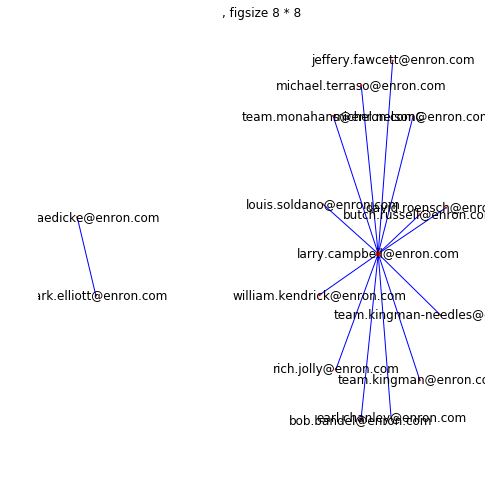

In [162]:
# small test
df.drop(df.index, inplace=True)
path = 'E:\\dataset\\enron_mail_20150507\\test\\1999\\Jul'  
df = build_df(df,path)
df.info()
print('------------------')
#print(df.head())
draw(df)

Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Apr\campbell-l~all_documents~12 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Apr\campbell-l~all_documents~14 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Apr\campbell-l~all_documents~6 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Apr\campbell-l~discussion_threads~10 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Apr\campbell-l~discussion_threads~12 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Apr\campbell-l~discussion_threads~5 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Apr\campbell-l~pg_e_pcbs~1 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Apr\campbell-l~pg_e_pcbs~5 , trying to

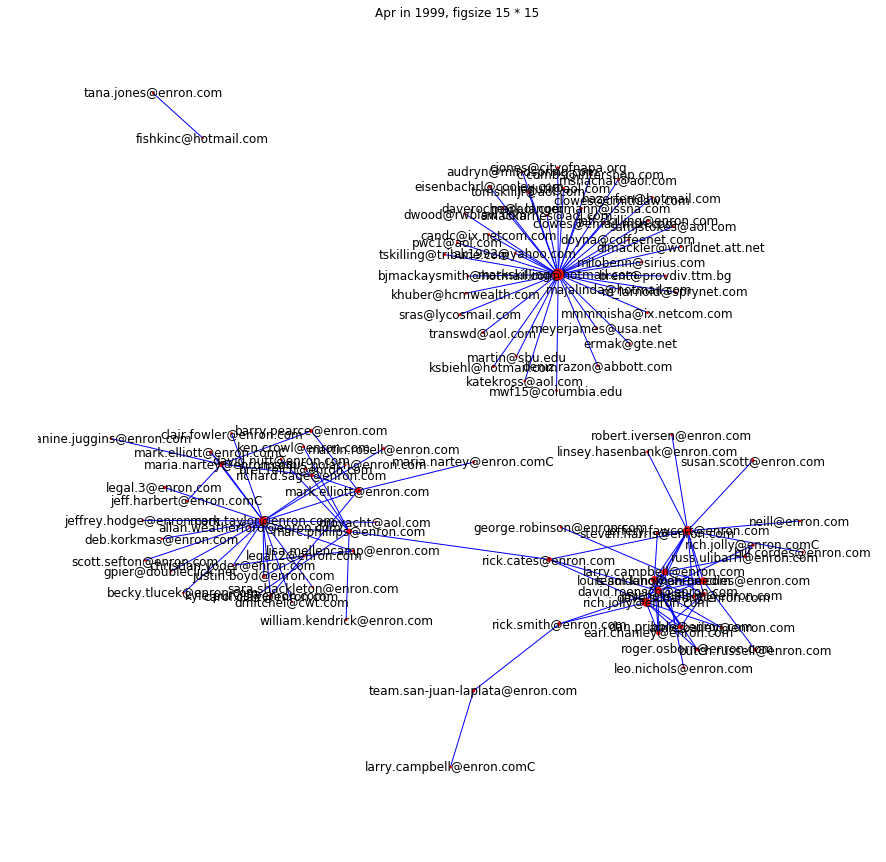

Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Aug\haedicke-m~all_documents~44 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Aug\haedicke-m~sent~21 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Aug\jones-t~all_documents~173 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Aug\jones-t~all_documents~200 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Aug\jones-t~notes_inbox~1 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Aug\jones-t~sent~199 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Aug\shackleton-s~all_documents~308 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Aug\shackleton-s~all_documents~309 , trying to find "Cc"
Cannot find "To"

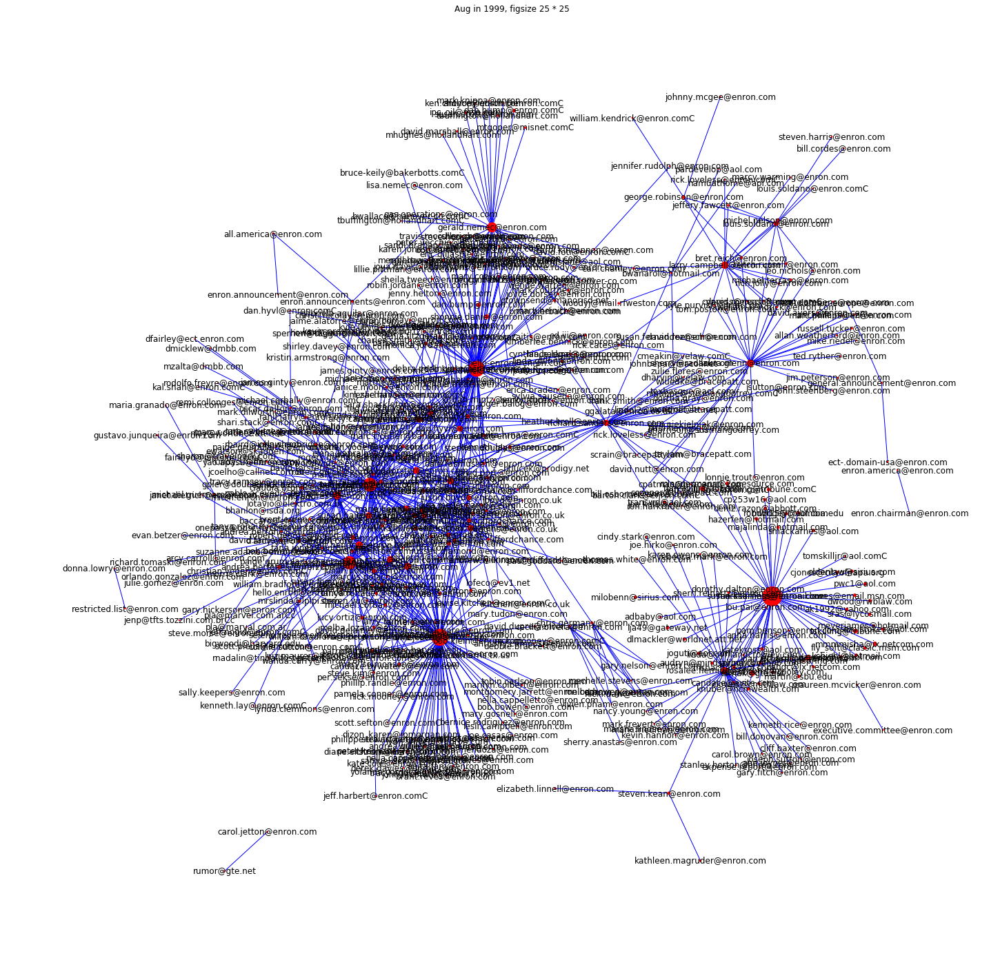

Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Dec\dasovich-j~all_documents~240 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Dec\dasovich-j~sent~2 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Dec\kaminski-v~all_documents~11052 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Dec\kaminski-v~all_documents~11073 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Dec\kaminski-v~all_documents~11144 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Dec\kaminski-v~australia~176 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Dec\kaminski-v~cera~36 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Dec\kaminski-v~discussion_threads~4275 , trying to find "C

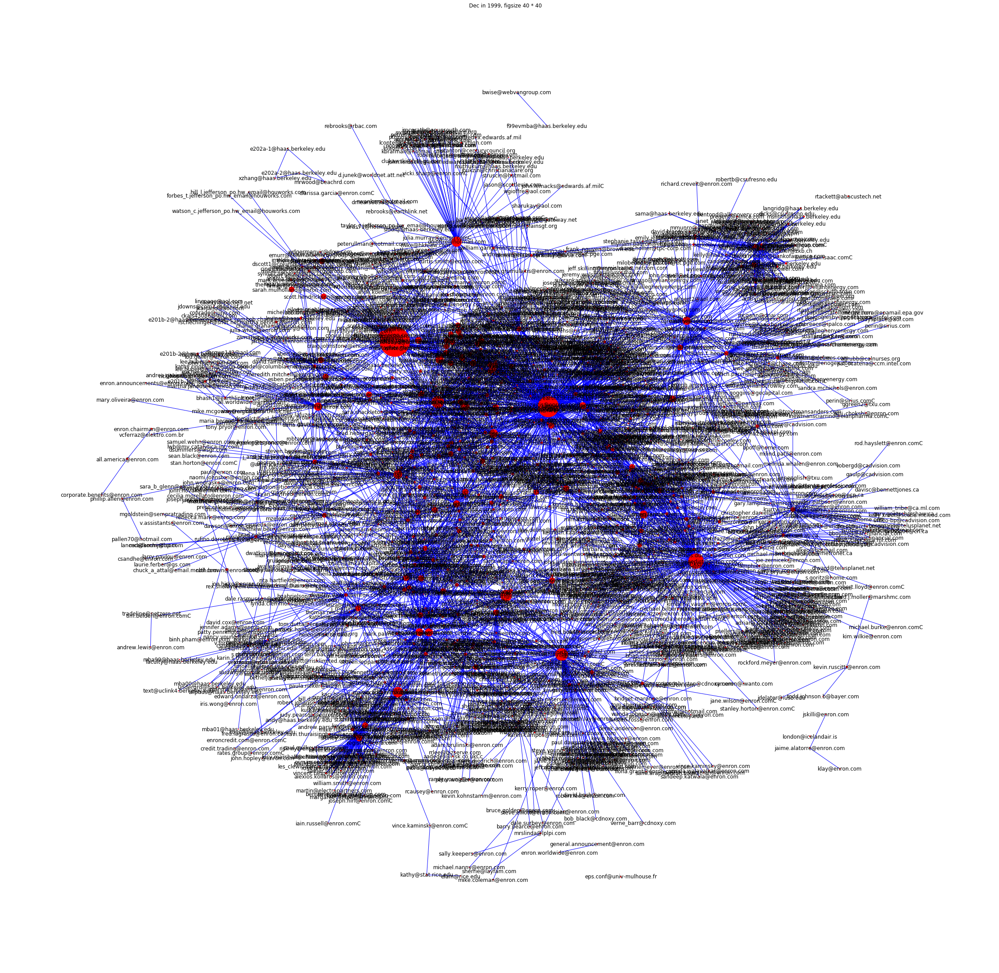

Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Feb\taylor-m~all_documents~172 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Feb\taylor-m~s_a__trading~11 , trying to find "Cc"
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 607 entries, 0 to 606
Data columns (total 2 columns):
From    607 non-null object
To      607 non-null object
dtypes: object(2)
memory usage: 9.6+ KB
------------------
Top 10 name 	 number of emails
[('markskilling@hotmail.com', 244.0),
 ('deb.korkmas@enron.com', 169.0),
 ('mark.taylor@enron.com', 97.0),
 ('no.address@enron.com', 85.0),
 ('mark.elliott@enron.com', 28.0),
 ('alan.aronowitz@enron.com', 11.0),
 ('scott.sefton@enron.com', 11.0),
 ('jeff.skilling@enron.com', 9.0),
 ('sara.shackleton@enron.com', 9.0),
 ('yao.apasu@enron.com', 9.0)]


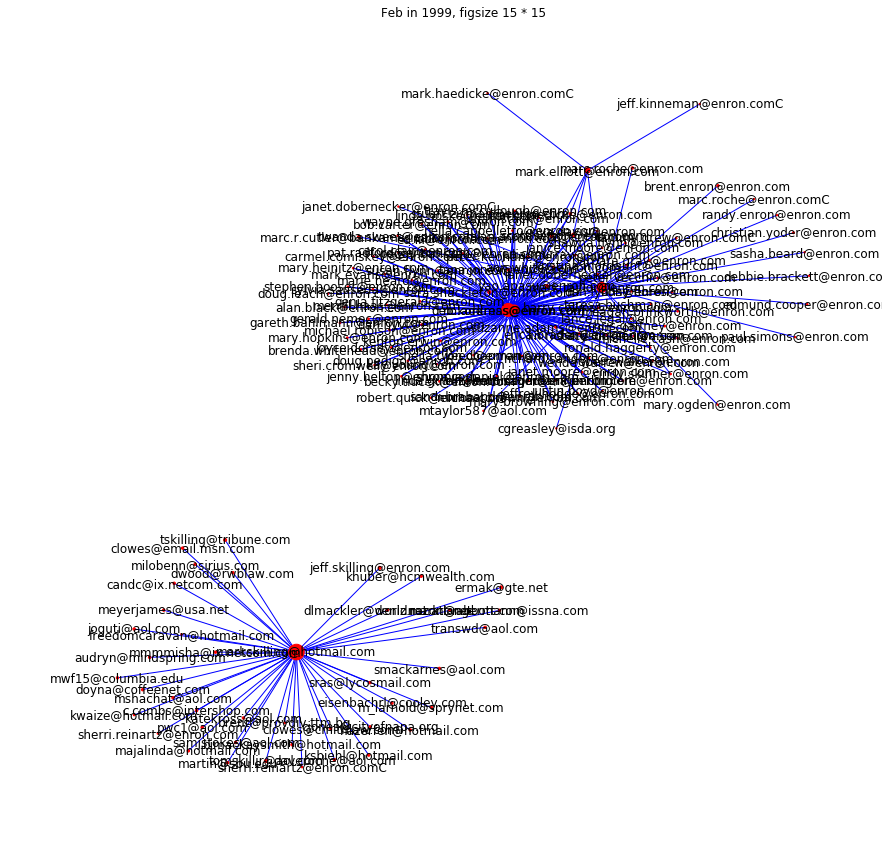

Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jan\taylor-m~all_documents~102 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jan\taylor-m~all_documents~120 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jan\taylor-m~all_documents~86 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jan\taylor-m~brazil_trading~3 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jan\taylor-m~sent~110 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jan\taylor-m~sent~92 , trying to find "Cc"
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 2 columns):
From    350 non-null object
To      350 non-null object
dtypes: object(2)
memory usage: 5.5+ KB
------------------
Top 10 name 	 number of emails
[('mark.taylor@enron.

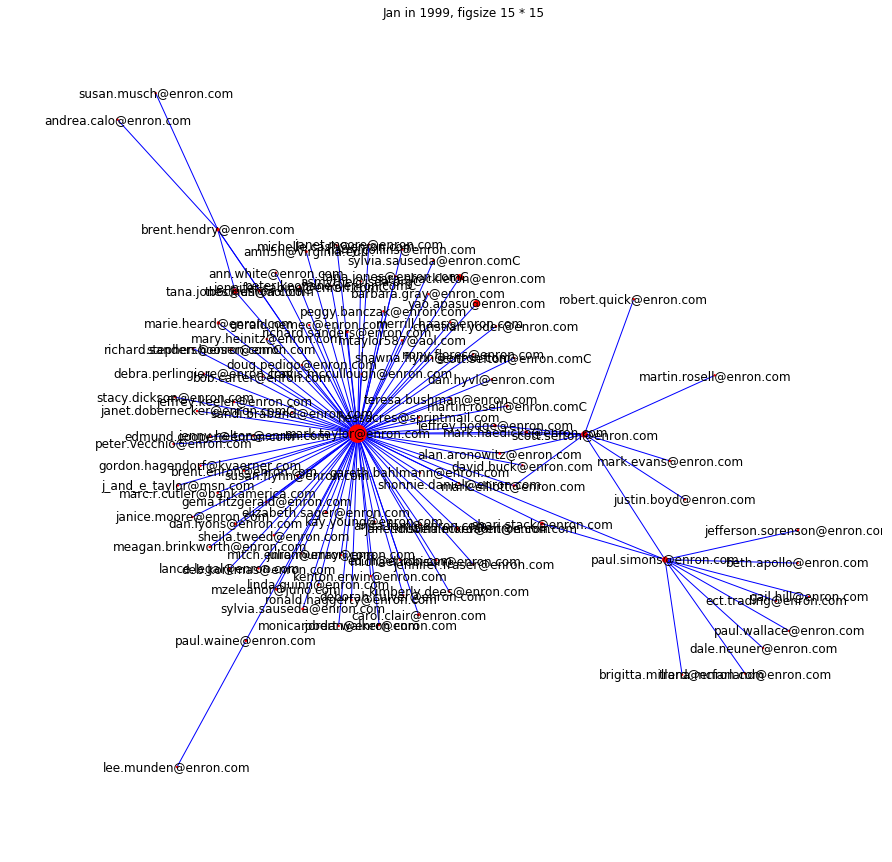

Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jul\haedicke-m~all_documents~28 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jul\haedicke-m~all_documents~36 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jul\haedicke-m~all_documents~38 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jul\nemec-g~all_documents~83 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jul\nemec-g~sent~80 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jul\sanders-r~all_documents~3538 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jul\sanders-r~all_documents~3539 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jul\sanders-r~all_documents~3541 , trying to find "Cc"
Cann

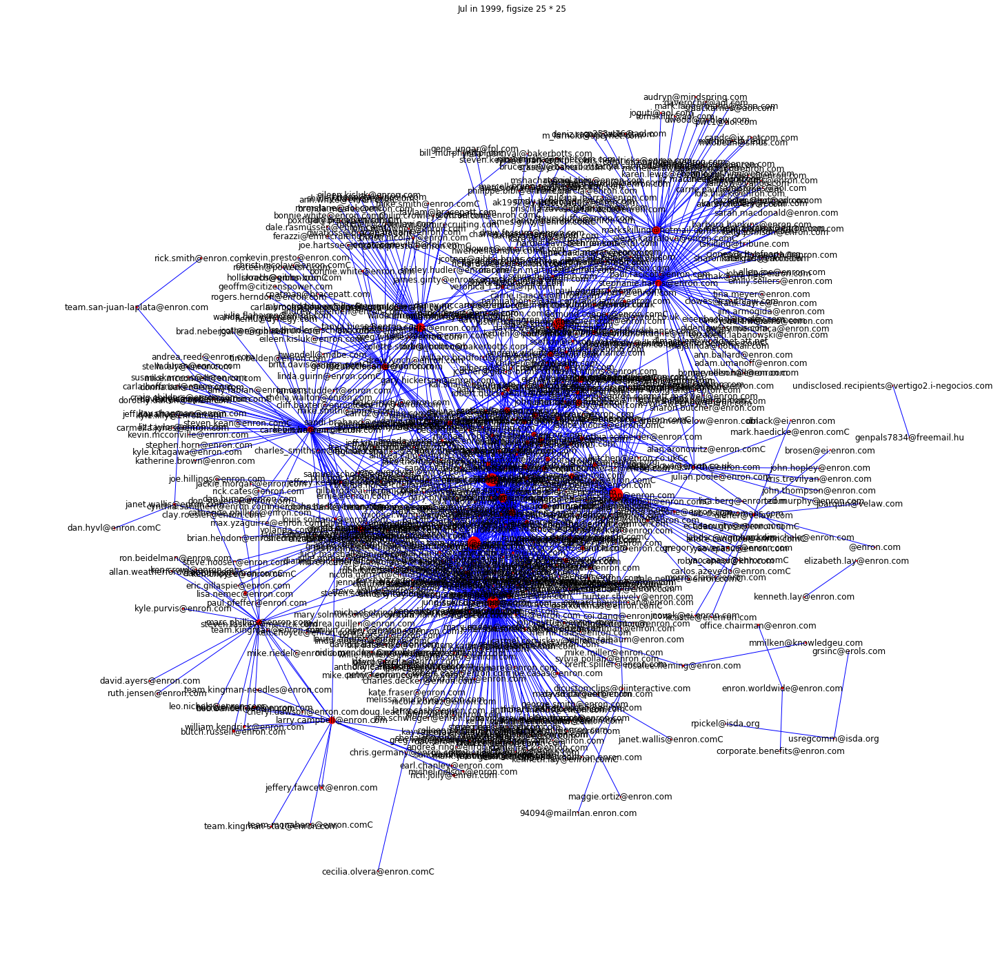

Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jun\haedicke-m~all_documents~5 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jun\sanders-r~all_documents~3500 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jun\sanders-r~all_documents~3507 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jun\sanders-r~sent~2016 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jun\sanders-r~sent~2023 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jun\shackleton-s~all_documents~128 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jun\shackleton-s~all_documents~132 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Jun\shackleton-s~sent~102 , trying to find "Cc"
Cannot 

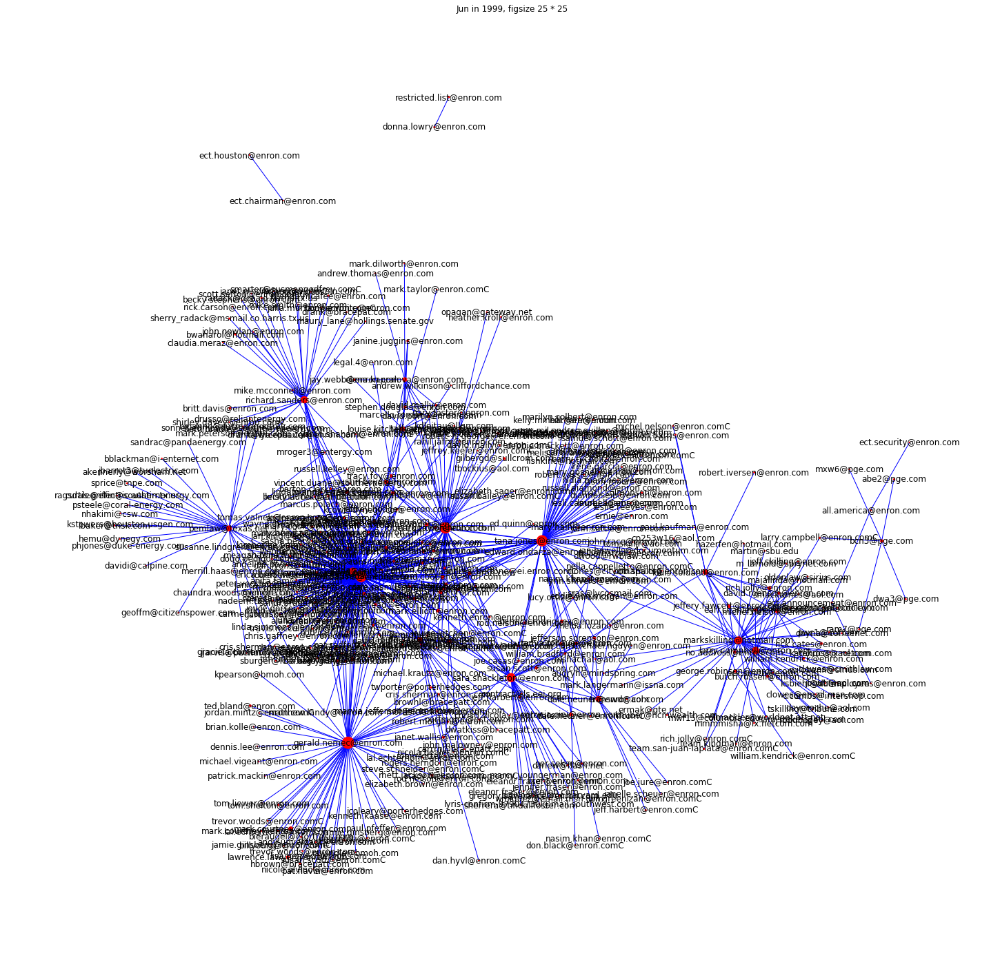

Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Mar\kean-s~all_documents~123 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Mar\kean-s~all_documents~124 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Mar\kean-s~archiving~untitled~2202 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Mar\kean-s~archiving~untitled~2203 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Mar\kean-s~attachments~554 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Mar\kean-s~calendar~untitled~123 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Mar\kean-s~calendar~untitled~124 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Mar\kean-s~discussion_threads~122 , trying to fin

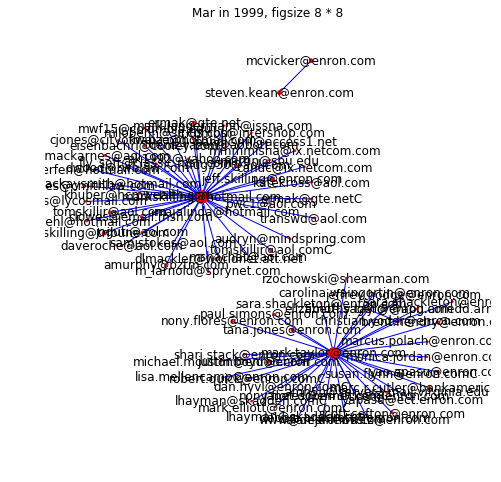

Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\May\jones-t~all_documents~58 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\May\jones-t~all_documents~62 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\May\jones-t~sent~58 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\May\jones-t~sent~62 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\May\nemec-g~all_documents~7 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\May\nemec-g~sent~7 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\May\sanders-r~all_documents~3457 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\May\sanders-r~all_documents~3464 , trying to find "Cc"
Cannot find "To" in file E:\dataset\e

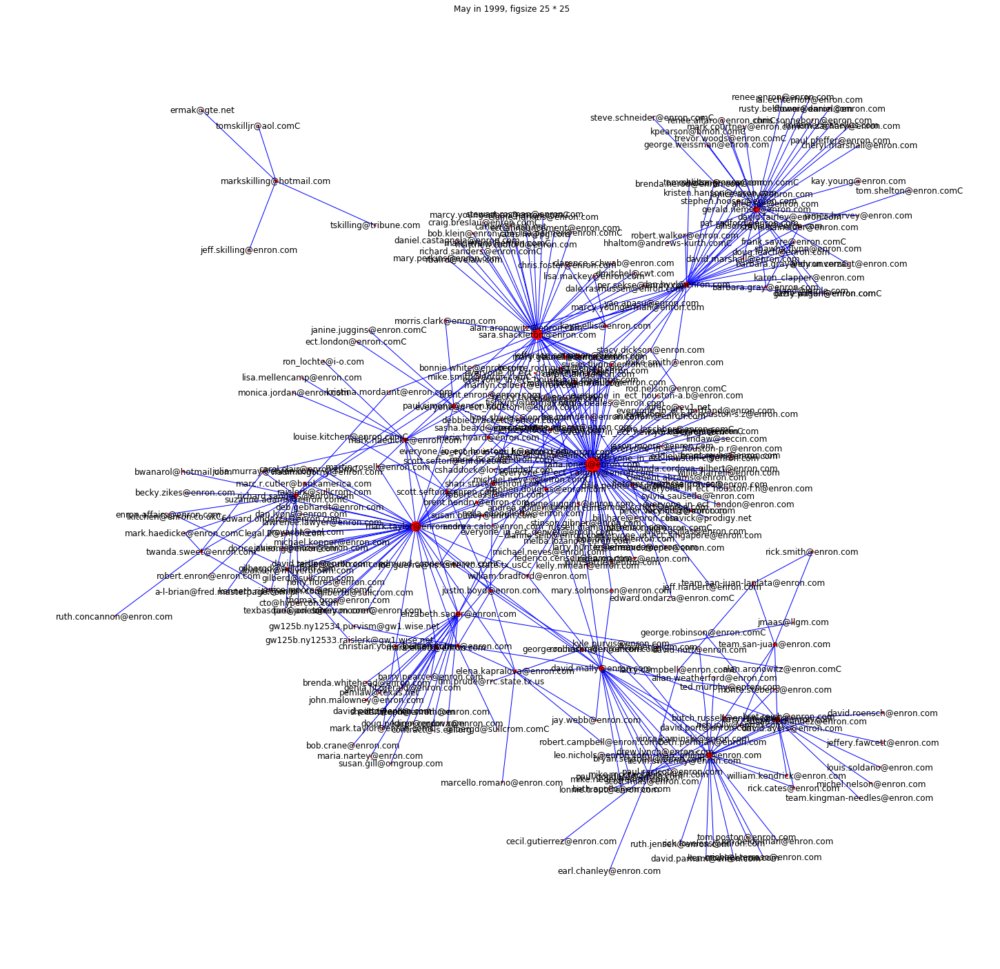

Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Nov\dasovich-j~all_documents~126 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Nov\dasovich-j~pg_e_hydro_sale~4 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Nov\hyvl-d~all_documents~119 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Nov\hyvl-d~power_projects~dom_rep~1 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Nov\kean-s~all_documents~169 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Nov\kean-s~all_documents~176 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Nov\kean-s~archiving~untitled~2150 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Nov\kean-s~archiving~untitled~2157 , trying to

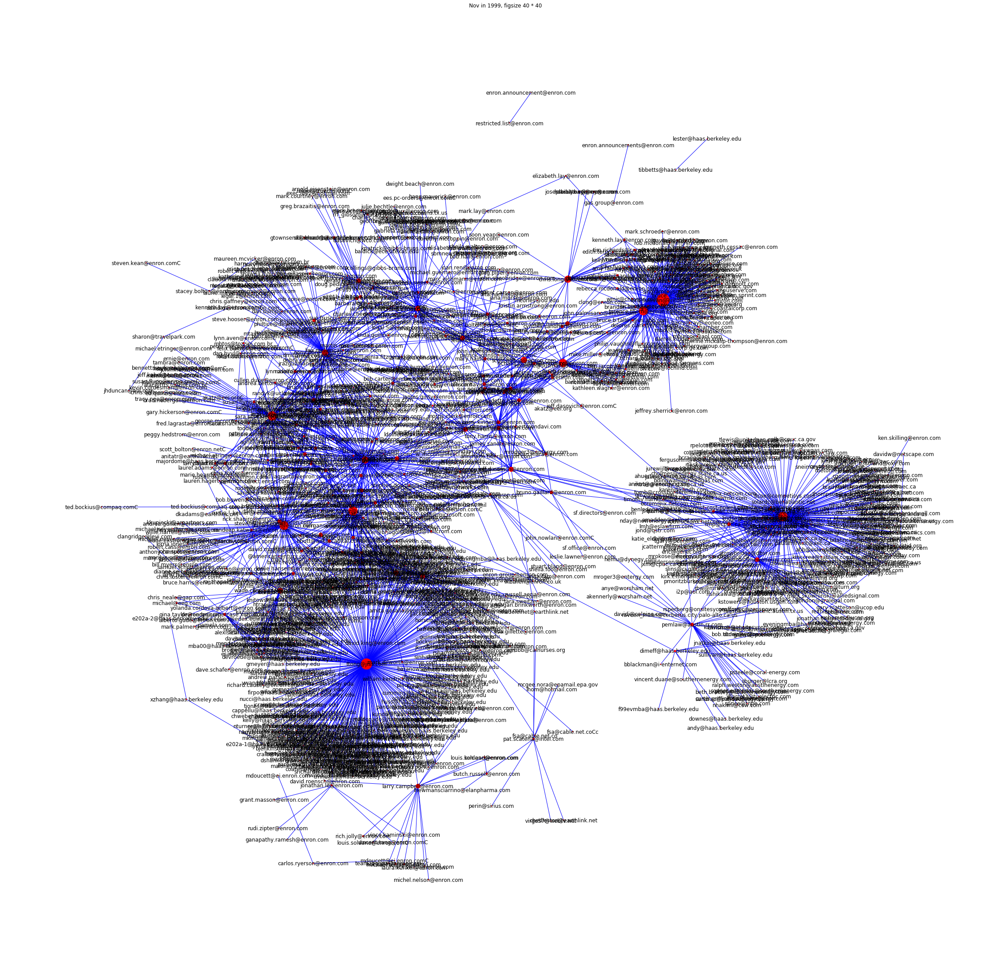

Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Oct\dasovich-j~all_documents~115 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Oct\dasovich-j~all_documents~90 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Oct\dasovich-j~energymarketplace~1 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Oct\dasovich-j~energymarketplace~2 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Oct\lay-k~all_documents~22 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Oct\lay-k~all_documents~23 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Oct\lay-k~all_documents~30 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Oct\lay-k~discussion_threads~17 , trying to find "Cc"


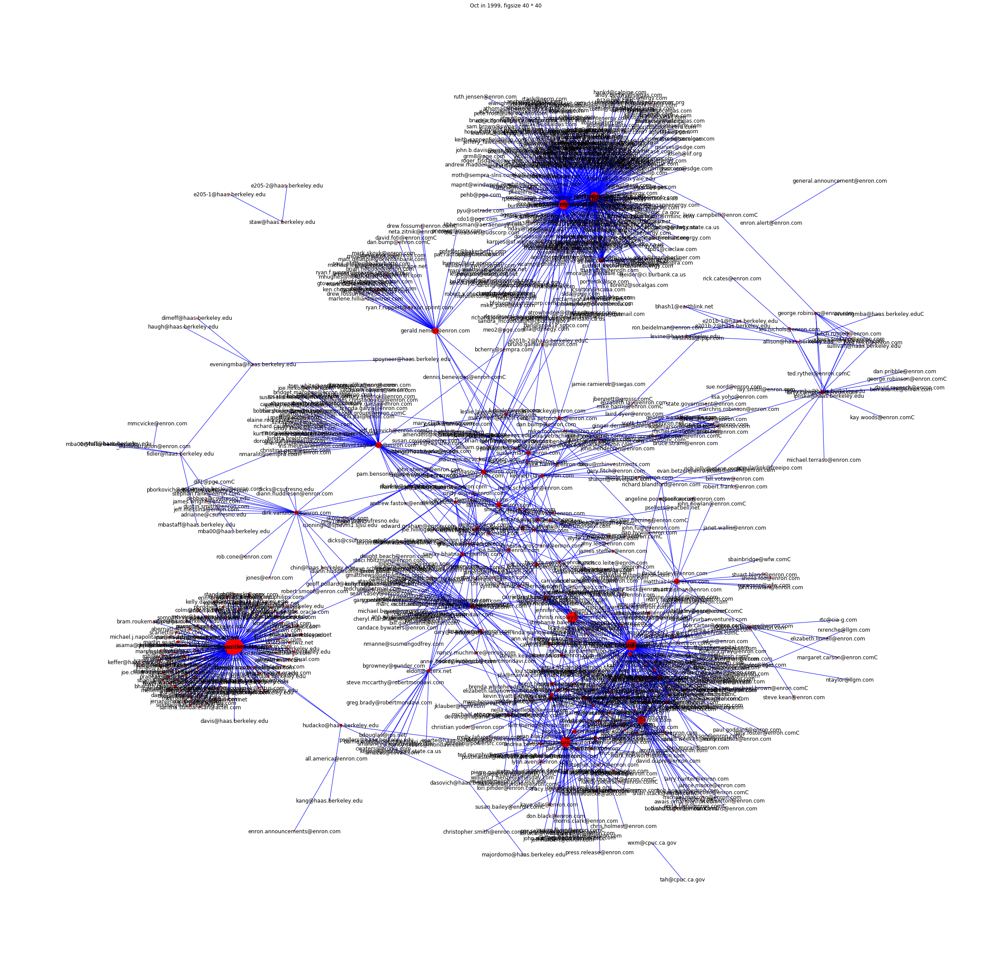

Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Sep\sanders-r~all_documents~3601 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Sep\sanders-r~all_documents~3602 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Sep\sanders-r~all_documents~3623 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Sep\shackleton-s~all_documents~482 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Sep\shackleton-s~all_documents~483 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Sep\shackleton-s~all_documents~499 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Sep\shackleton-s~all_documents~524 , trying to find "Cc"
Cannot find "To" in file E:\dataset\enron_mail_20150507\sortbytime\1999\Sep\shackleton-s~all_documents~

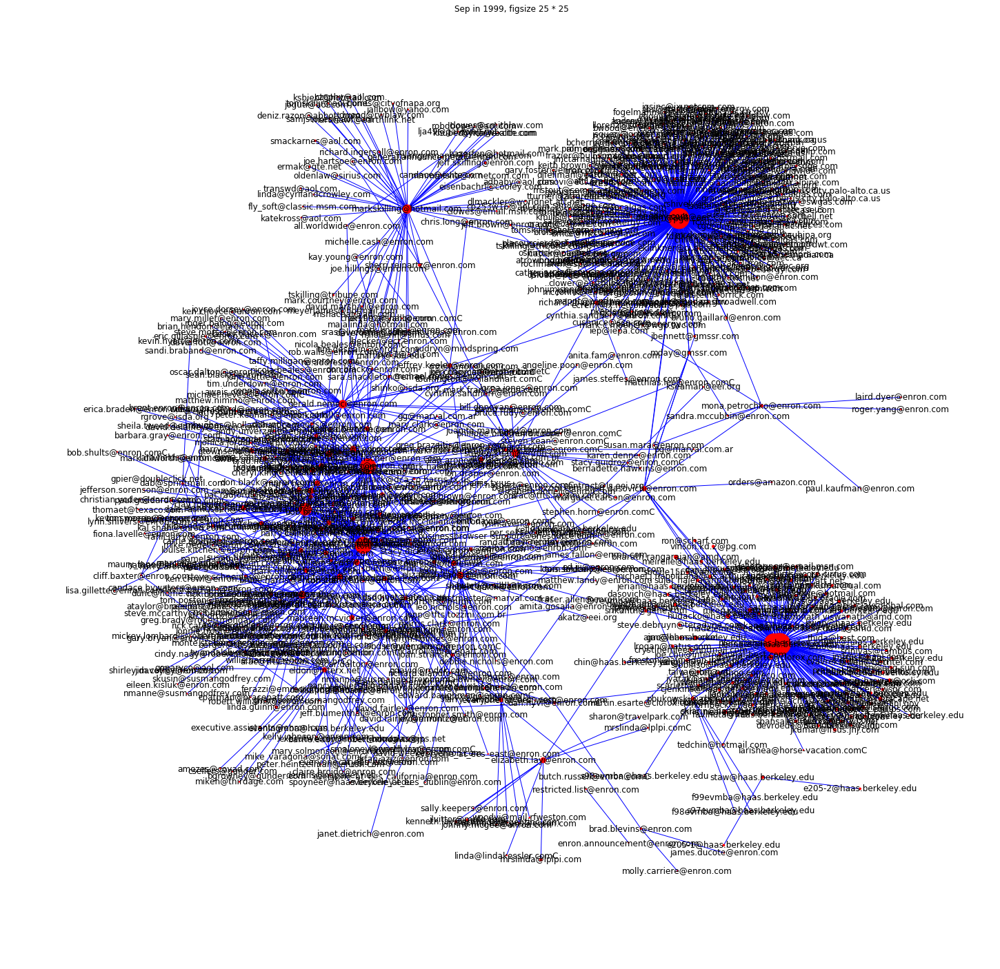

In [164]:
# check emails in 1999
path = 'E:\\dataset\\enron_mail_20150507\\sortbytime\\1999'
for month in os.listdir(path):
    df.drop(df.index, inplace=True)
    df = build_df(df, path + '\\' + str(month))
    df.info()
    print('------------------')
    draw(df, str(month)+ ' in 1999')